# Explorative Datenanalyse Part 3

In [11]:
from config import *
# Arbeite von jetzt an mit den gesäuberten Daten
# (siehe prepare.data_loader.load_data für Erläuterung)
df = load_data('_cleaned_L2')

### Planare Winkel nach Kategorie

Wir konzentrieren uns auf die planaren Winkel, da diese die 'Abstände' der Helices am besten widerspiegeln.

Wir können diese für die way-3 Strukturen in je zwei Plots (1vs2 und 2vs3) darstellen. Dabei farblich unterteilen nach:
1) whole_sequence -> Sequenz des Multiloops aus RNALoops
2) parts_seq -> wie 1), aber zusätzlich unterteilt wenn Sequenz gleich aber Bindungen verschieden
3) home_structure -> pdb_id der Struktur
4) cluster -> cluster gefunden mittels agglomerativem Clustering

Die ersten beiden sind ähnlich, wir müssen da genauer hinsehen um unterschiede festzustellen. \
Dazu werden mittels main_explore.py Plots erzeugt, die unter results/angles gespeichert sind. Hier wird der Unterschied von 1) und 2) deutlich.

Bei der pdb_id sieht man keine Abhängigkeit. Eine gegebene Sequenz findet sich durchschnittlich in 1.5 home Strukturen, unabhängig von ihrer Häufigkeit. \
Das heißt eine Sequenz die 150 mal vorkommt wurde in etwa aus 100 verschiedenen home Strukturen extrahiert.

Wir sehen, dass gleiche Sequenzen ähnliche Winkel haben, da die Farben clustern. \
Wir sehen aber auch, dass per agglomerativem Clustering noch viel deutlichere Cluster gefunden werden können, also gibt es wohl noch Ähnlichkeiten über die Sequenz hinaus.

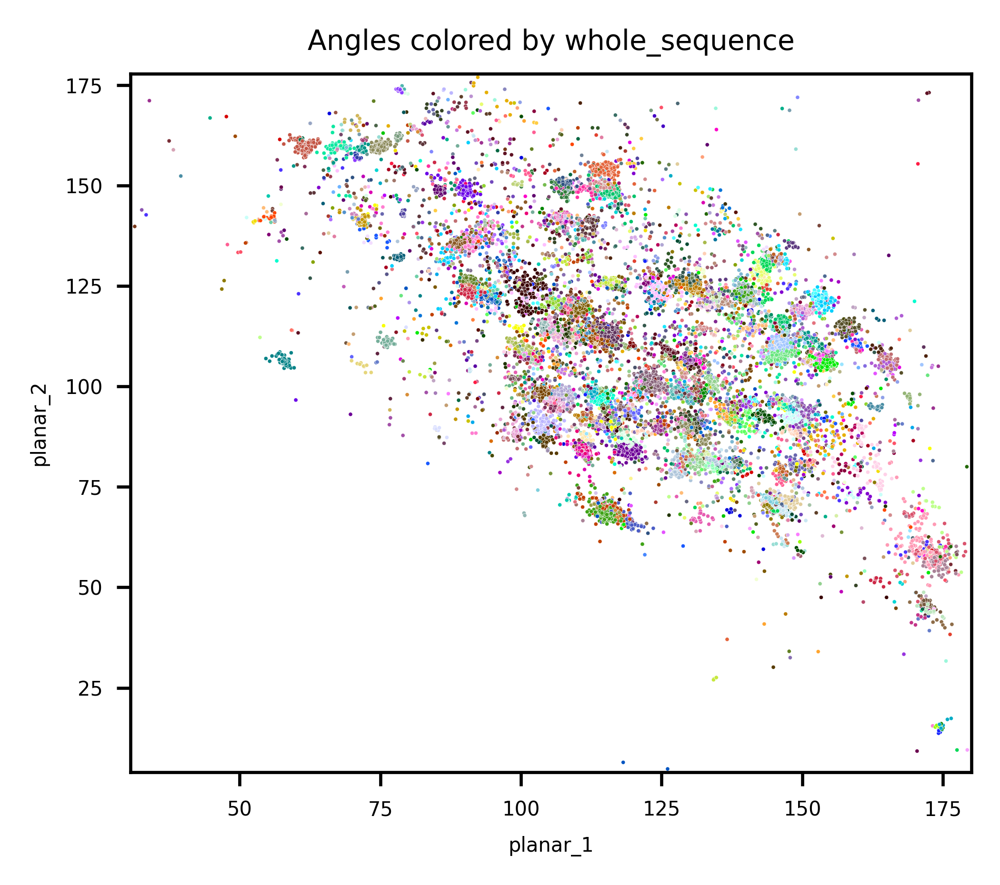

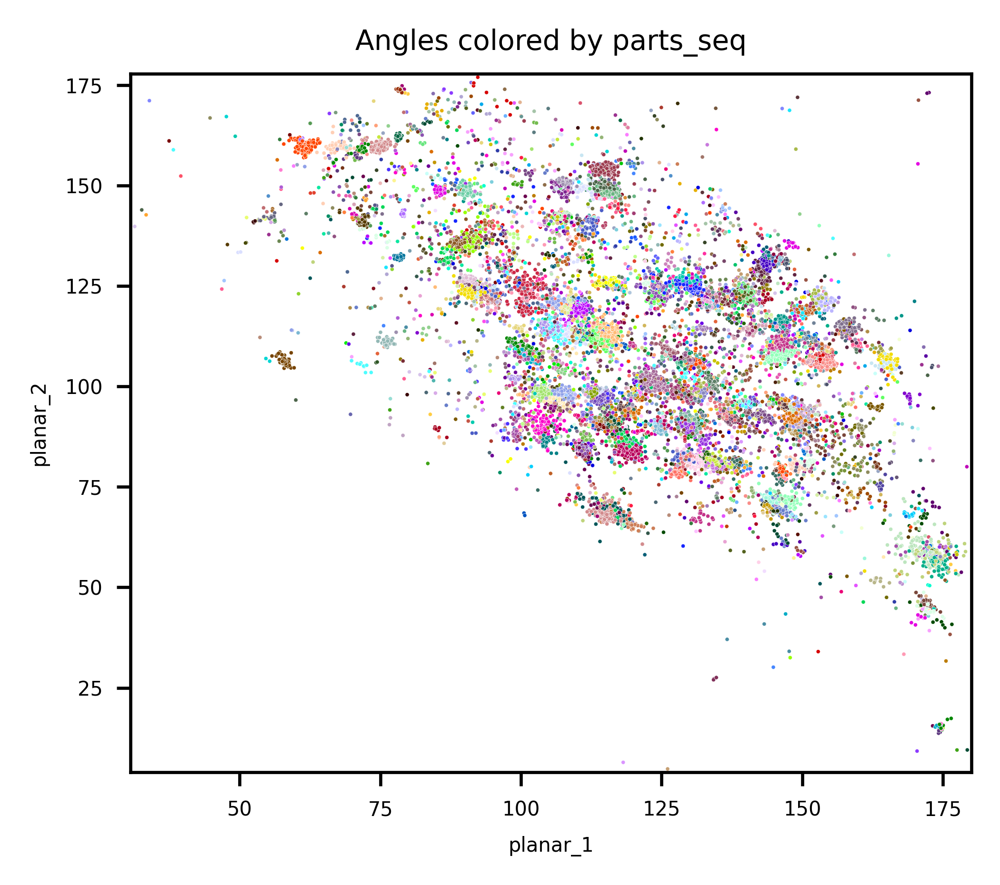

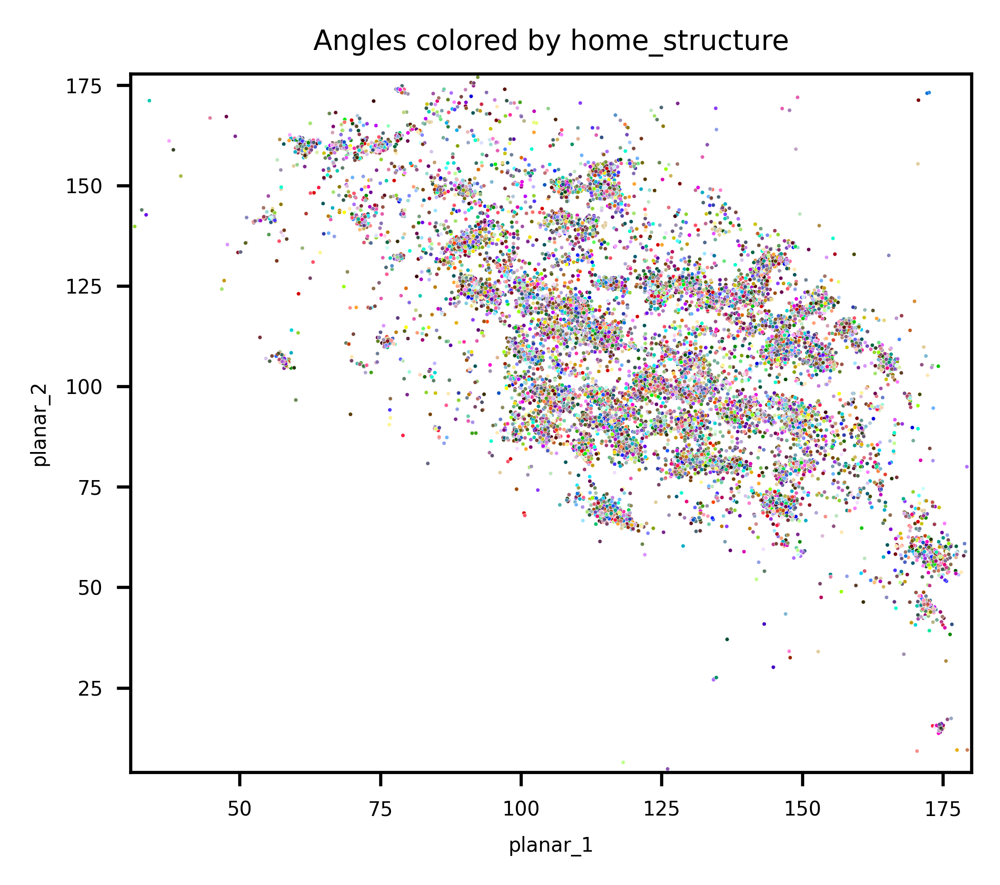

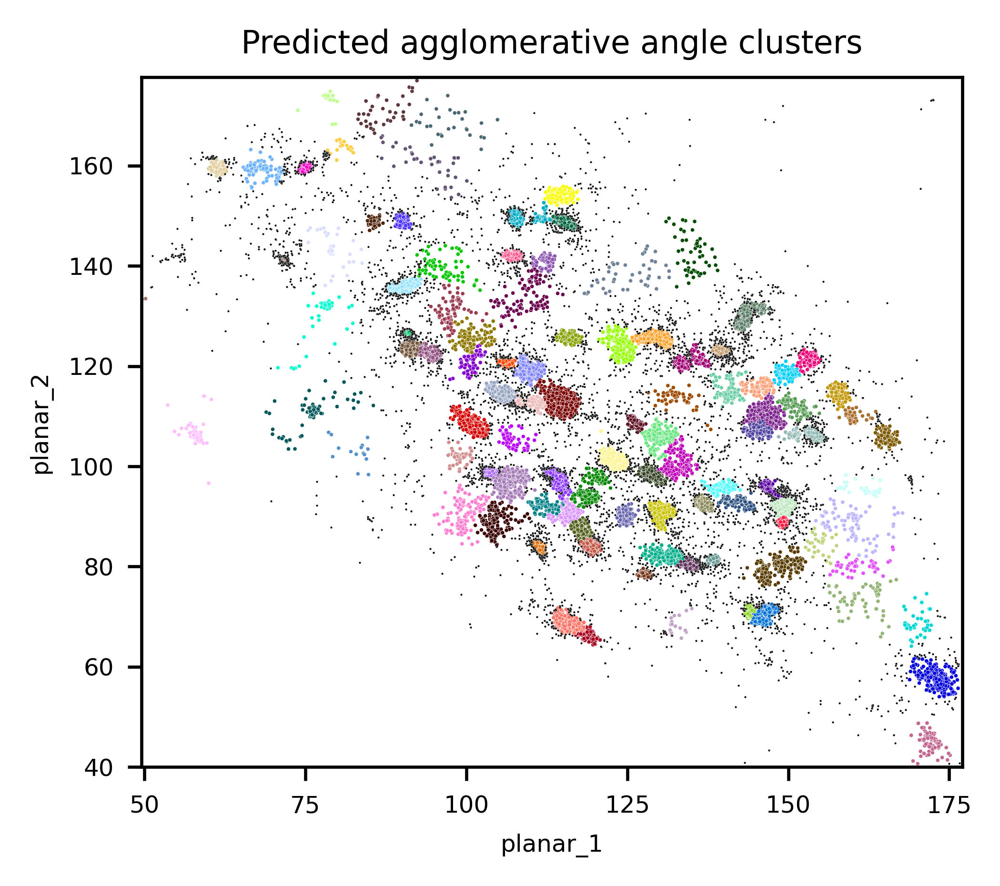

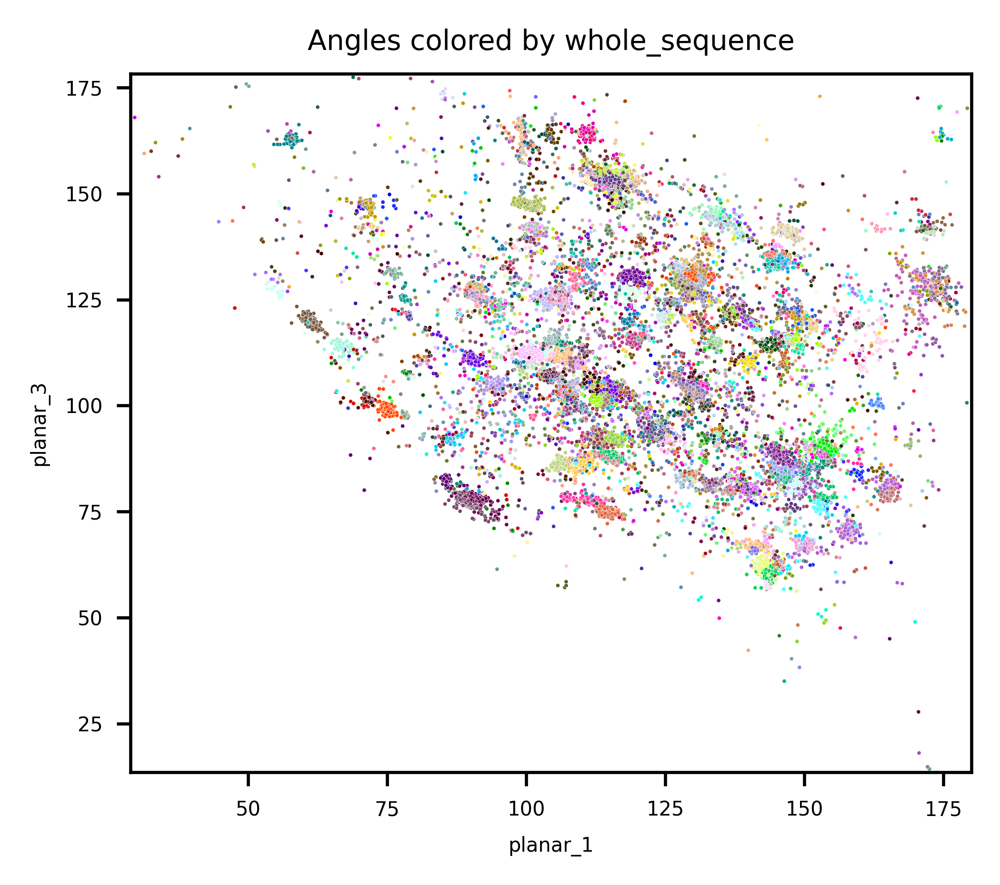

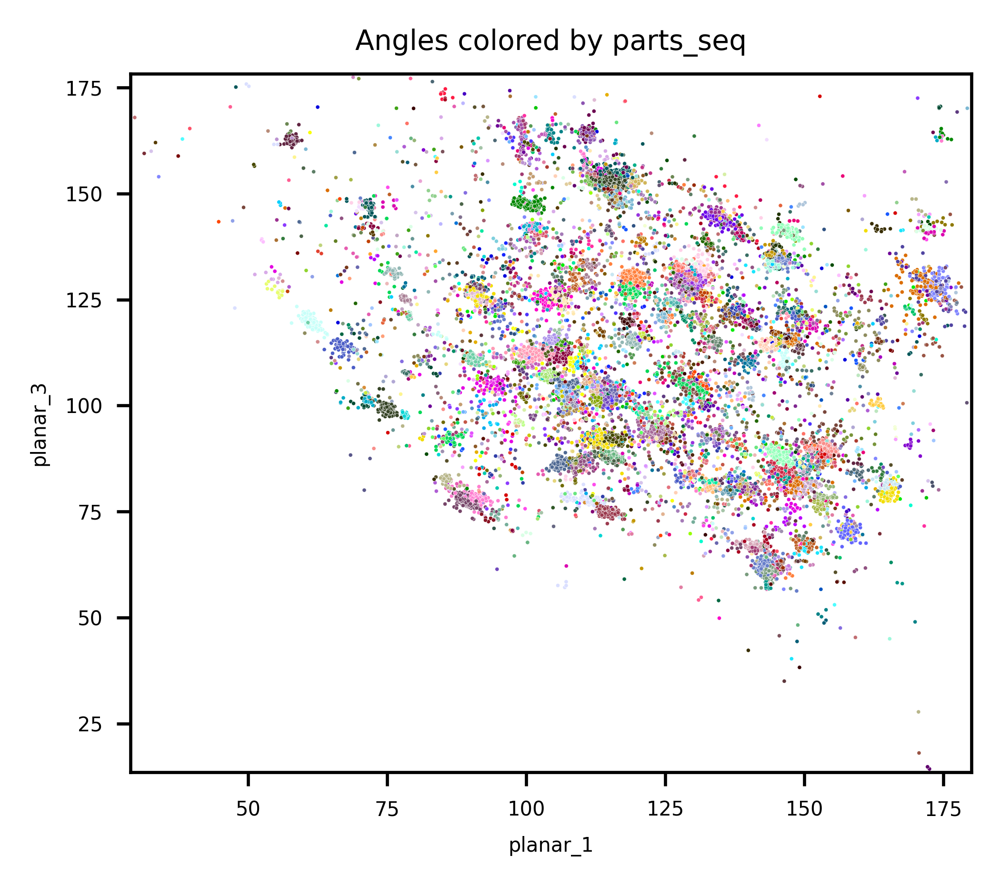

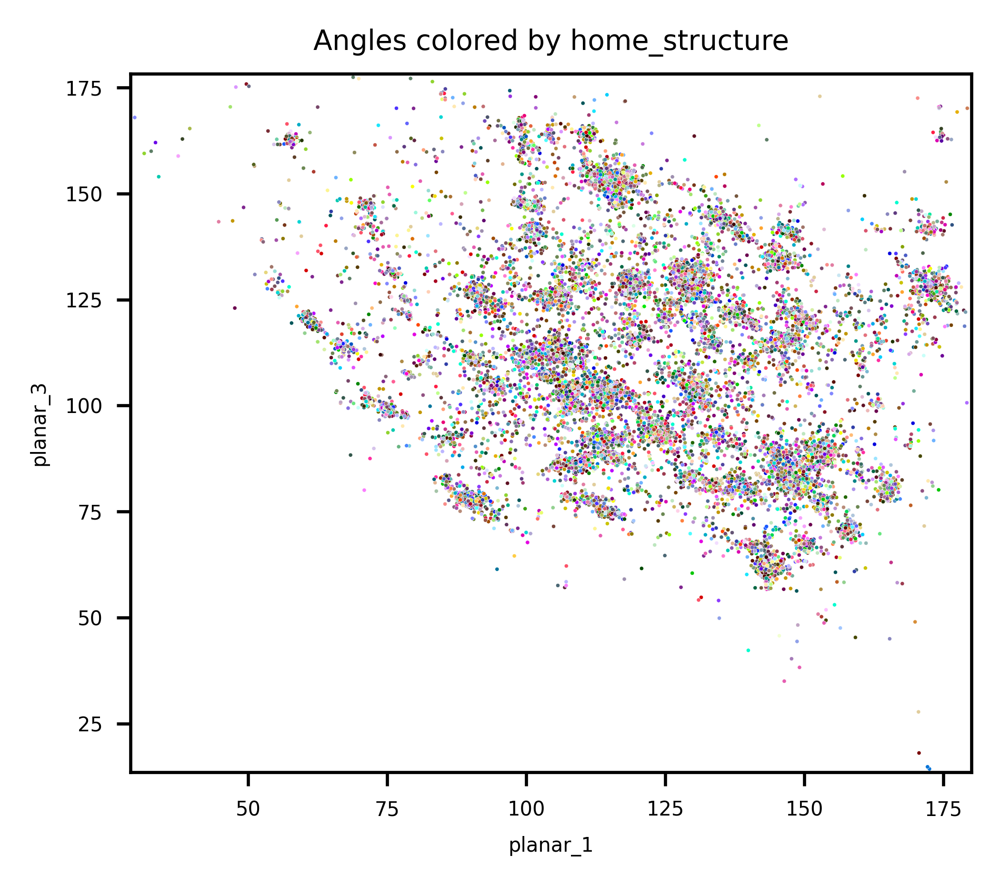

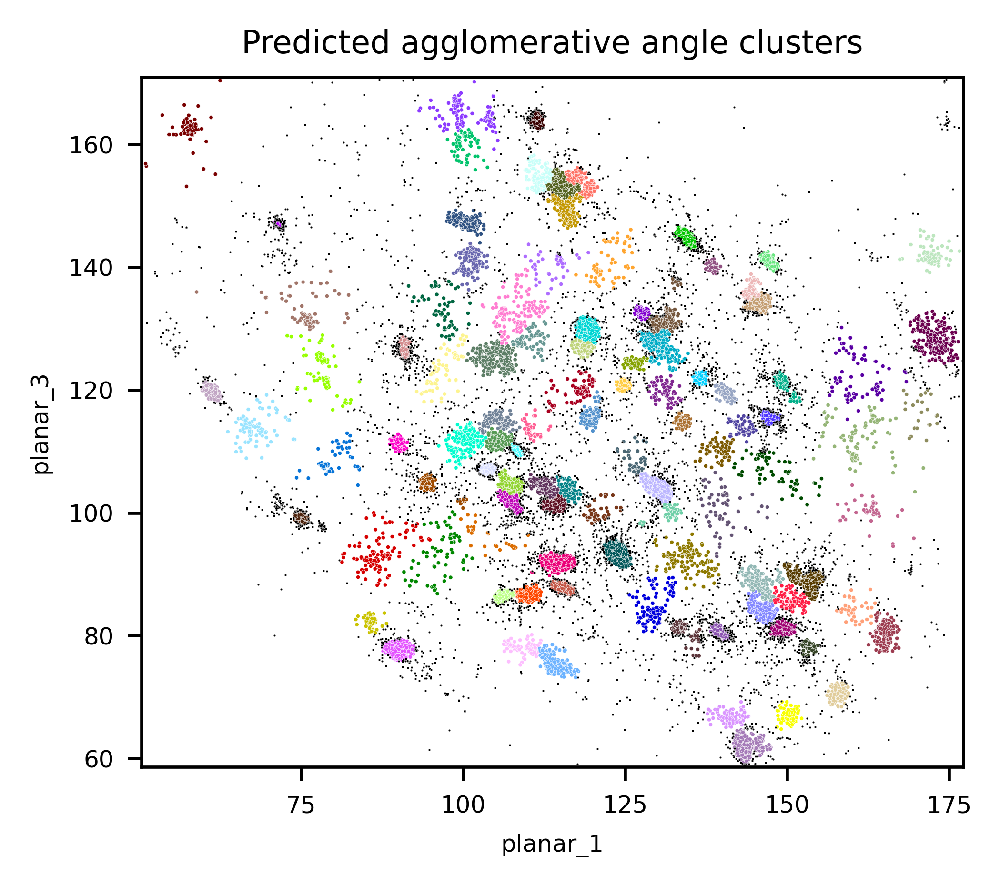

In [51]:
kwargs = dict(fs=5, contam=10**-6, dpi=600, save=True, do_cluster=False)

for f in [["planar_1", "planar_2"], ["planar_1", "planar_3"]]:
    
    _ = cluster_angles(
        df.way3, f, hue_col='whole_sequence', **kwargs
    )
    
    _ = cluster_angles(
        df.way3, f, hue_col='parts_seq', **kwargs
    )
    
    _ = cluster_angles(
        df.way3, f, hue_col='home_structure', **kwargs
    )

    _ = cluster_angles(
        df.way3, f, fs=6, contam=0.2, do_cluster=True, dpi=600, save=True
    )

### Gemittelte Planarwinkel nach Sequenz

Wir können die Winkel aller Strukturen einer Sequenz mitteln, und die Ergebnisse vergleichen.

Im Folgenden sind Sequenzen mit mehr als 100 Strukturen mit ihren mittleren Winkeln dargestellt. \
Die Größe der grauen Kreise schätzt die Streuung der Winkel innerhalb der Sequenz Klasse ab.

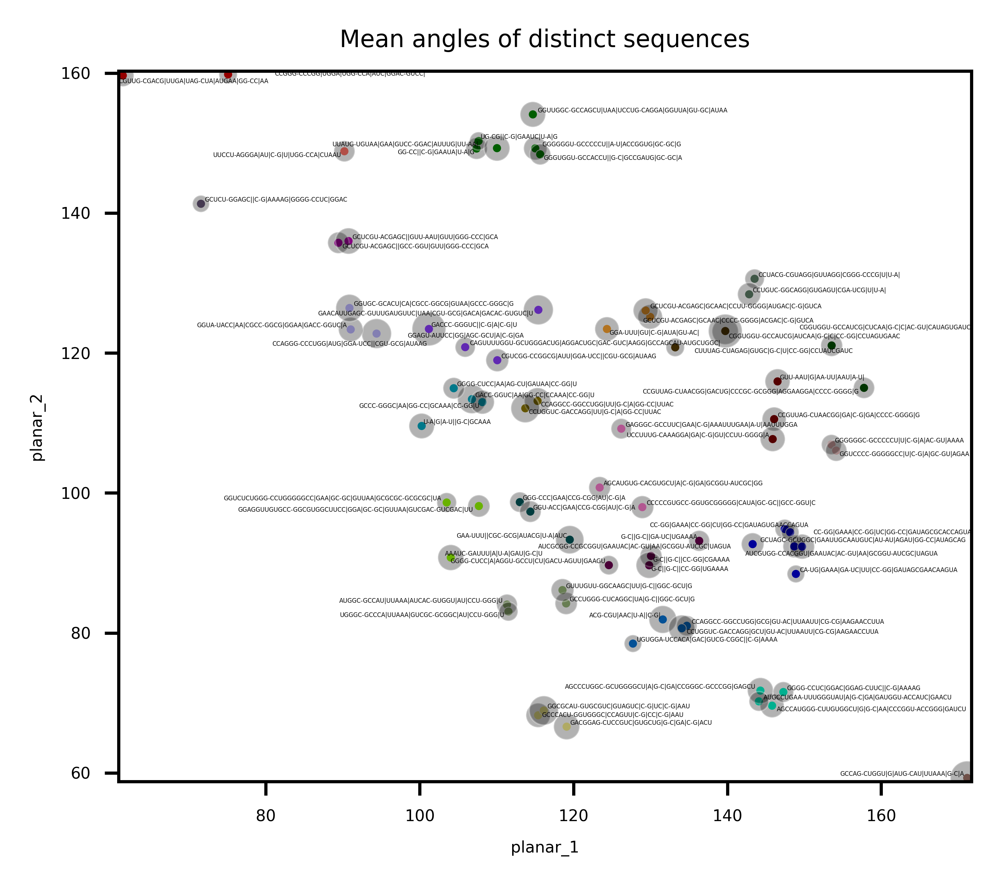

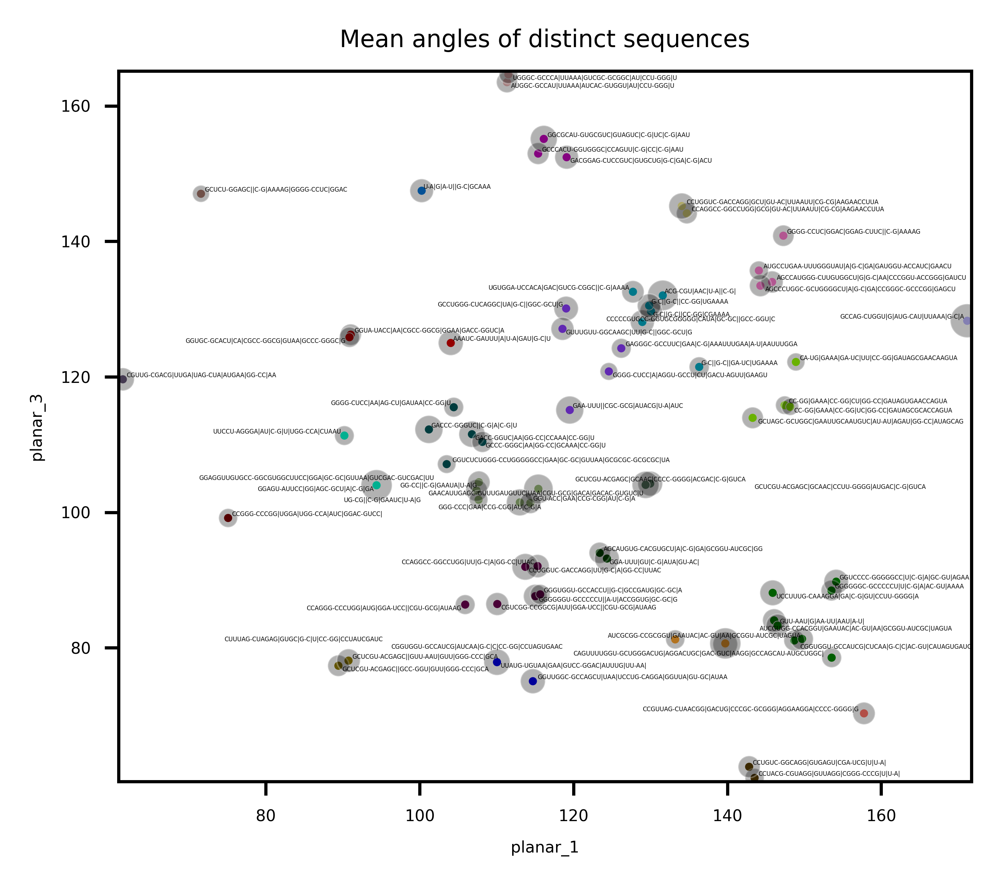

In [79]:
kwargs = dict(
    n_cluster=25,
    contam=1,
    n_neighbors=1,
    ms_data=5,
    ms_other=1,
    plot_labels=True,
    annot_perc=100,
    dpi=800,
    title='Mean angles of distinct sequences',
    fs=4,
    save=True,
    extension='mean',
)

data = get_sequence_mean_angles(get_frequent_sequences(df.way3), 'index')

for f in [["planar_1", "planar_2"], ["planar_1", "planar_3"]]:
    std_cols = [c + '_std' for c in f]
    size_col = np.sqrt(data[std_cols[0]]**2/2 + data[std_cols[1]]**2/2)
    ax = cluster_angles(data, feature=f, size_col=size_col, **kwargs)

Wir können auch alle Sequenzen darstellen, dann aber ohne Annotation, das wird zu unübersichtlich:

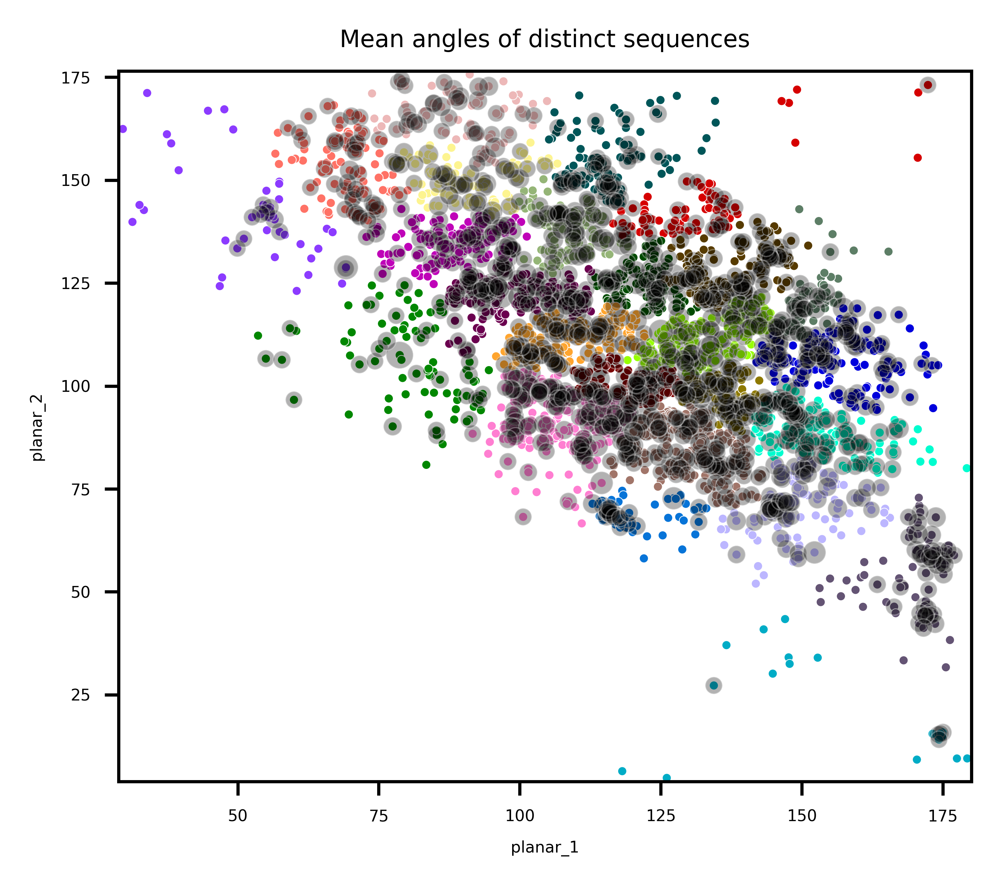

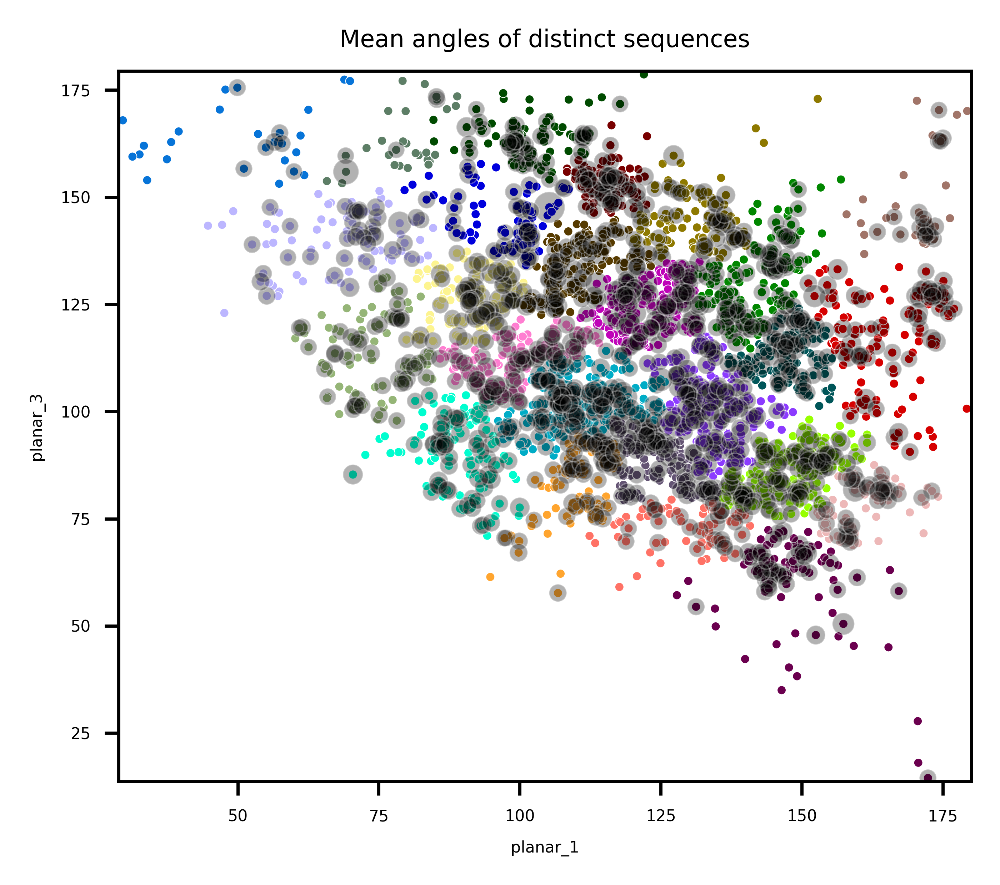

In [80]:
data = get_sequence_mean_angles(get_frequent_sequences(df.way3, min_n=1), 
                                'index')

kwargs['annot_perc'] = 0
kwargs['extension'] = 'mean_all'

for f in [["planar_1", "planar_2"], ["planar_1", "planar_3"]]:
    std_cols = [c + '_std' for c in f]
    size_col = np.sqrt(data[std_cols[0]]**2/2 + data[std_cols[1]]**2/2)
    ax = cluster_angles(data, feature=f, size_col=size_col, **kwargs)

Wir können anhand davon jetzt untersuchen welche Sequenzen signifikant verschiedene Winkel haben und welche nicht.

Im weiteren Verlauf können wir Cluster bilden, z.B. im Bezug auf die summierten Wikeldifferenzen der Sequenzen:

/home/lukas/anaconda3/envs/RNALoops/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/home/lukas/anaconda3/envs/RNALoops/lib/python3.10/site-packages/seaborn/matrix.py:627: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



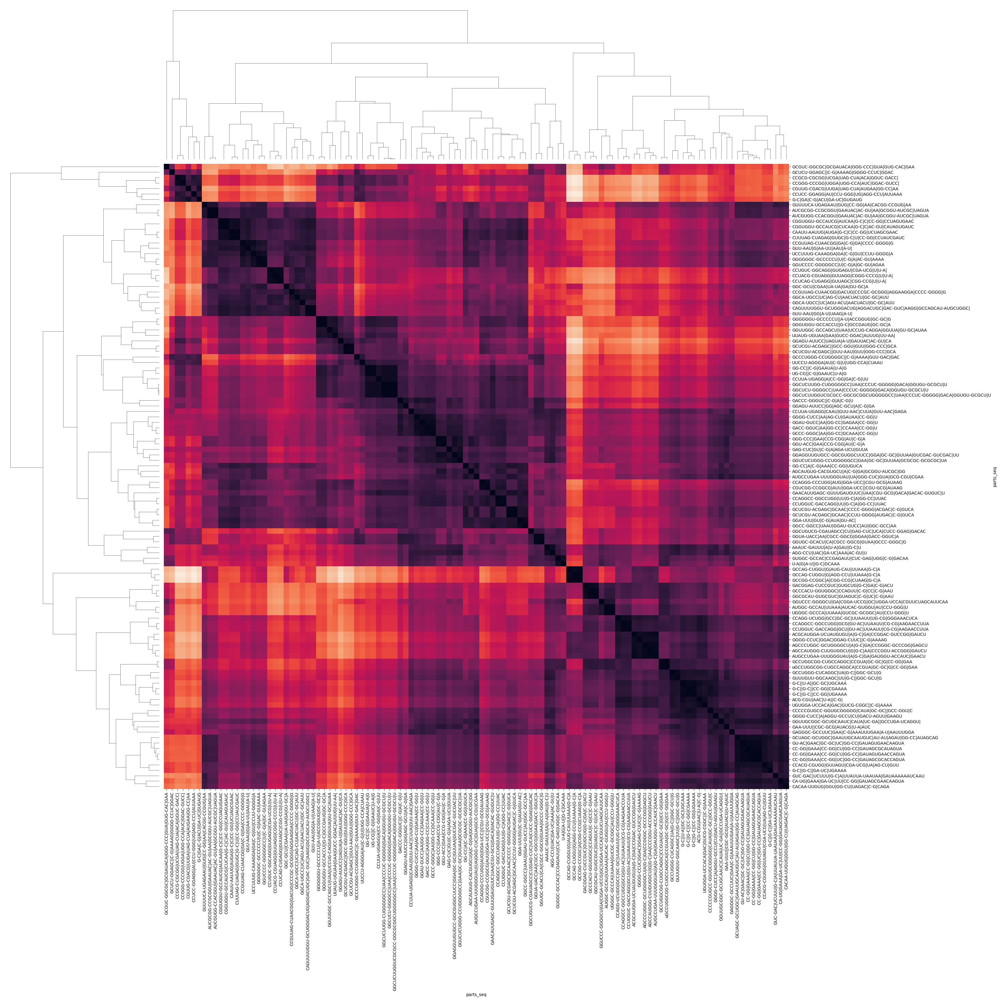

In [92]:
planar_angles_diff_clustermap(df.way3)

In [4]:
agg = load_agg_df()

In [14]:
sequences, _ = get_sequences_ordered_by_nstructures(df, n=None, cat='parts_seq')

In [15]:
len(sequences)

7856

In [18]:
results = []
sep = pd.DataFrame([['-'*50, np.nan, np.nan, np.nan]])
start = default_timer()
for counter, sequence in enumerate(sequences[:20]):
    print(f'Sequence {counter+1}/{len(sequences)}')
    result = get_similar_seq(sequence, df=agg, z=2, verbose=1)
    result = result.reset_index().drop('index', axis=1)
    results.append(result)
    sep.columns = results[-1].columns
    results.append(sep)
                   
print(default_timer()-start)
results = pd.concat(results)
results.to_csv('results/similar_sequences.csv')

Sequence 1/7856
Sequence 2/7856
Sequence 3/7856
Sequence 4/7856
Sequence 5/7856
Sequence 6/7856
Sequence 7/7856
Sequence 8/7856
Sequence 9/7856
Sequence 10/7856
Sequence 11/7856
Sequence 12/7856
Sequence 13/7856
Sequence 14/7856
Sequence 15/7856
Sequence 16/7856
Sequence 17/7856
Sequence 18/7856
Sequence 19/7856
Sequence 20/7856
40.87514003000251


Zuvor wäre es aber sinnvoll noch weitere Feature zu extrahieren, wie z.B. die Länge der Sequenz.